# Behavior Tree
File with all defined functions to support _Behavior Tree Plotting_

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import json

In [2]:
def hierarchy_pos(G, root, levels=None, width=1., height=1.):
    '''If there is a cycle that is reachable from root, then this will see infinite recursion.
        G: the graph
        root: the root node
        levels: a dictionary
                key: level number (starting from 0)
                value: number of nodes in this level
        width: horizontal space allocated for drawing
        height: vertical space allocated for drawing'''
    TOTAL = "total"
    CURRENT = "current"
    def make_levels(levels, node=root, currentLevel=0, parent=None):
        """Compute the number of nodes for each level
        """
        if not currentLevel in levels:
            levels[currentLevel] = {TOTAL : 0, CURRENT : 0}
        levels[currentLevel][TOTAL] += 1
        neighbors = G.neighbors(node)
        for neighbor in neighbors:
            if not neighbor == parent:
                levels =  make_levels(levels, neighbor, currentLevel + 1, node)
        return levels

    def make_pos(pos, node=root, currentLevel=0, parent=None, vert_loc=0):
        dx = 1/levels[currentLevel][TOTAL]
        left = dx/2
        pos[node] = ((left + dx*levels[currentLevel][CURRENT])*width, vert_loc)
        levels[currentLevel][CURRENT] += 1
        neighbors = G.neighbors(node)
        for neighbor in neighbors:
            if not neighbor == parent:
                pos = make_pos(pos, neighbor, currentLevel + 1, node, vert_loc-vert_gap)
        return pos
    if levels is None:
        levels = make_levels({})
    else:
        levels = {l:{TOTAL: levels[l], CURRENT:0} for l in levels}
    vert_gap = height / (max([l for l in levels])+1)
    return make_pos({})

In [3]:
def get_current_opened_path(aStar_tree, target_node_key):
    last_opened = target_node_key
    current_opened_path = [last_opened]

    back_to_root=False
    while back_to_root==False:
        pai = aStar_tree[last_opened]["pai"]
        current_opened_path.append(pai)
        last_opened = pai
        if pai==-1:
            back_to_root=True
            
    return current_opened_path  

def has_any_leaf(aStar_tree, node_key):
    has_leaf=False
    for k in aStar_tree:
        if aStar_tree[k]["pai"]==node_key:
            has_leaf=True
    return has_leaf

def get_target_node_key(aStar_tree):
    for key in aStar_tree:
        if aStar_tree[key]["state"]=="closed":
            if has_any_leaf(aStar_tree, key)==False:
                return key


In [4]:
def plot_BehaviorTree(aStar_tree, i_file, aStar_treeHistory_len):
    graph_edges=[]
    
    target_node_key = None
    if i_file+1==aStar_treeHistory_len:
        target_node_key = get_target_node_key(aStar_tree)

    for i in aStar_tree:
        pai=aStar_tree[i]["pai"]

        graph_edges.append([i,pai])

    G=nx.Graph()
    G.add_edges_from(graph_edges)
    color_map=[]
    for node in G:
        state="closed"

        if node!=-1:
            state=aStar_tree[node]["state"]

        if node==target_node_key:
            color_map.append("yellow")
        elif state=="opened":
            color_map.append("gray")
        else:
            color_map.append("red")
            
    

    pos = hierarchy_pos(G,-1) 

    f=plt.figure(figsize=(12,10)) 
    nx.draw(G, pos=pos,
            with_labels=True,
            node_color=color_map,
            edge_color=["white"],
            font_color="white"
           )
    f.set_facecolor('black')
    f.savefig("bigScale_behaviorTree/behaviorTreePlots/behaviorTree"+str(i_file)+"_0.png", dpi=100)
    plt.close(f)
    
    if i_file+1==aStar_treeHistory_len:
        current_opened_path = get_current_opened_path(aStar_tree, target_node_key)
        current_opened_path_reversed = current_opened_path[::-1]

        for i in range(len(current_opened_path_reversed)):
            path = current_opened_path_reversed[:i+1]
            
            color_map=[]
            for node in G:
                state="closed"

                if node!=-1:
                    state=aStar_tree[node]["state"]
    
                if node in path:
                    color_map.append("yellow")
                elif state=="opened":
                    color_map.append("gray")
                else:
                    color_map.append("red")



            pos = hierarchy_pos(G,-1) 

            f=plt.figure(figsize=(12,10)) 
            nx.draw(G, pos=pos,
                    with_labels=True,
                    node_color=color_map,
                    edge_color=["white"],
                    font_color="white"
                   )
            f.set_facecolor('black')
            f.savefig("bigScale_behaviorTree/behaviorTreePlots/behaviorTree"+str(i_file+i+1)+"_0.png", dpi=100)
            plt.close(f)

## Read Json file
##### aStar_treeHistory saved as Json file

In [5]:
##Read JSON file
aStar_treeHistory=""
with open('bigScale_behaviorTree/data.json') as file:
    aStar_treeHistory = json.load(file)
    
##Set dictionary keys back to int
i=0
for h in aStar_treeHistory:
    aStar_treeHistory[i]={int(k):v for k,v in h.items()}
    i=i+1

### Plotting
##### Saving images on disk.

In [6]:
aStar_treeHistory_len=len(aStar_treeHistory)
progress_steps=[]

for i, aStar_tree in enumerate(aStar_treeHistory):
    plot_BehaviorTree(aStar_tree, i, aStar_treeHistory_len)
    
    progress_percentage = (i/aStar_treeHistory_len)
    round_progress_percentage = round(progress_percentage,1)
    if round_progress_percentage not in progress_steps:
        progress_steps.append(round_progress_percentage)
        print(round_progress_percentage)

0.0
0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0


### Create GIF

In [7]:
!pip install imageio

In [8]:
import imageio.v2 as imageio
import numpy as np
import os

from IPython.display import Image

from shutil import copyfile

In [9]:
path_pathwayPlots="bigScale_behaviorTree/behaviorTreePlots/"
path_GIF="bigScale_behaviorTree/GIF/"
filenames = []
delay=7

In [11]:
frames=[]

delay=7
i=0
error=False
while error==False: 
    try:
        image = imageio.imread(path_pathwayPlots+"behaviorTree"+str(i)+"_0.png")
        frames.append(image)

        if i%50==0:
            print("addToGif: "+str(i))

        i=i+1
    except :
        ##Add Pause on finish State
        i=i-1
        for i2 in range(delay,10*delay):
            image = imageio.imread(path_pathwayPlots+"behaviorTree"+str(i)+"_0.png")
            frames.append(image)
        error=True

addToGif: 0
addToGif: 50
addToGif: 100


In [13]:
# Save them as frames into a gif 
exportname = path_GIF+"behaviorTree.gif"
imageio.mimsave(exportname, frames, format='GIF', duration=0.5)

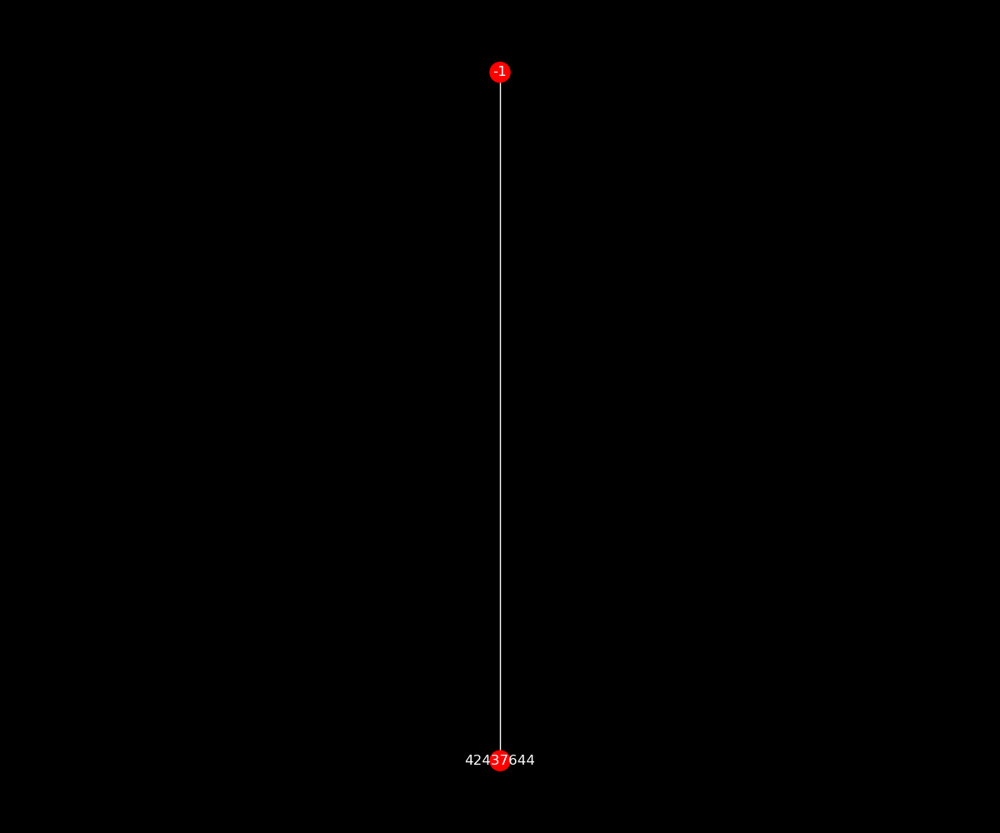

In [19]:
from IPython.display import Image
Image(open(path_GIF+"behaviorTree.gif",'rb').read(), width=700)